In [126]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [127]:
def display(img):
    # Convert BGR to RGB for correct display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.imshow(img_rgb)
    plt.axis('off')   # remove axis
    plt.show()

# Load document

In [128]:
img = cv2.imread("docu5.jpg")

In [129]:
def clean_document(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Convert to grayscale if not already
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use adaptive thresholding
    black_text = cv2.adaptiveThreshold(gray, 255,
                                       cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY,
                                       15, 10)

    # HSV image already computed
    lower_blue = np.array([55, 40, 40], dtype=np.uint8)
    upper_blue = np.array([155, 255, 255], dtype=np.uint8)
    
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
    
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    mask_blue = cv2.morphologyEx(mask_blue, cv2.MORPH_CLOSE, kernel)
    
    mask_blue = cv2.dilate(mask_blue, kernel, iterations=1)
    
    result_blue = cv2.bitwise_and(img, img, mask=mask_blue)
    
    # Optionally increase saturation and value to make blue pop
    hsv_blue = cv2.cvtColor(result_blue, cv2.COLOR_BGR2HSV)
    hsv_blue[:, :, 1] = cv2.add(hsv_blue[:, :, 1], 50)  # increase saturation
    hsv_blue[:, :, 2] = cv2.add(hsv_blue[:, :, 2], 50)  # increase brightness
    result_blue = cv2.cvtColor(hsv_blue, cv2.COLOR_HSV2BGR)
    # Convert black text to BGR
    black_text_bgr = cv2.cvtColor(black_text, cv2.COLOR_GRAY2BGR)
    
    # Combine using maximum (preserve darker pixels)
    final = cv2.max(black_text_bgr, result_blue)
    return final

In [130]:
def extract_signatures(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # define HSV range for blue
    lower = np.array([55, 40, 40], dtype=np.uint8)
    upper = np.array([155, 255, 255], dtype=np.uint8)

    # Convert each to BGR (so OpenCV can display)
    lower_bgr = cv2.cvtColor(np.uint8([[lower]]), cv2.COLOR_HSV2BGR)[0][0]
    upper_bgr = cv2.cvtColor(np.uint8([[upper]]), cv2.COLOR_HSV2BGR)[0][0]

    mask = cv2.inRange(hsv, lower, upper)

    # Create a white canvas same size as image
    white_bg = np.ones_like(img, dtype=np.uint8) * 255  # 255 = white
    
    # Define blue color in BGR
    blue_color = (255, 0, 0)  # BGR: Blue
    
    # Make a colored image where mask is white
    signature_img = white_bg.copy()
    signature_img[mask != 0] = blue_color

    return signature_img

In [131]:
def crop_signatures(cleaned_image, pad=30):
    """
    Robust signature cropper:
    - Handles light or soft blue signatures
    - Auto-thresholds adaptively
    - Crops multiple signatures accurately
    - Includes small dots and nearby disconnected strokes
    """
    img = cleaned_image.copy()
    
    # Step 1: Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Step 2: Adaptive threshold — works even if ink is faint
    binary = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 35, 15
    )
    
    # Step 3: Aggressive morphological operations to connect nearby elements
    # Use rectangular kernel to connect horizontal strokes better
    kernel_rect = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 5))
    kernel_vert = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 25))
    kernel_round = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    
    # Connect in multiple directions
    morph = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel_rect, iterations=2)
    morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel_vert, iterations=2)
    morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel_round, iterations=3)
    
    # Heavy dilation to bridge gaps
    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20, 20))
    morph = cv2.dilate(morph, dilate_kernel, iterations=3)
    
    # Step 4: Keep all components (even small dots)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(morph, connectivity=8)
    mask = np.zeros_like(morph)
    
    # Very low threshold - keep almost everything
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] > 30:  # Minimal filtering
            mask[labels == i] = 255
    
    # Step 5: Find contours with convex hull expansion
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    h, w = img.shape[:2]
    crops = []
    
    for cnt in contours:
        # Use convex hull to include nearby disconnected strokes
        hull = cv2.convexHull(cnt)
        x, y, cw, ch = cv2.boundingRect(hull)
        area = cv2.contourArea(hull)
        
        # Lower thresholds
        if area < 200 or cw < 25 or ch < 25:
            continue
        
        # Add extra padding to catch nearby strokes
        extra_pad = 20  # Additional padding beyond normal pad
        x1 = max(x - pad - extra_pad, 0)
        y1 = max(y - pad - extra_pad, 0)
        x2 = min(x + cw + pad + extra_pad, w)
        y2 = min(y + ch + pad + extra_pad, h)
        
        crop = img[y1:y2, x1:x2]
        crops.append(crop)
    
    return crops

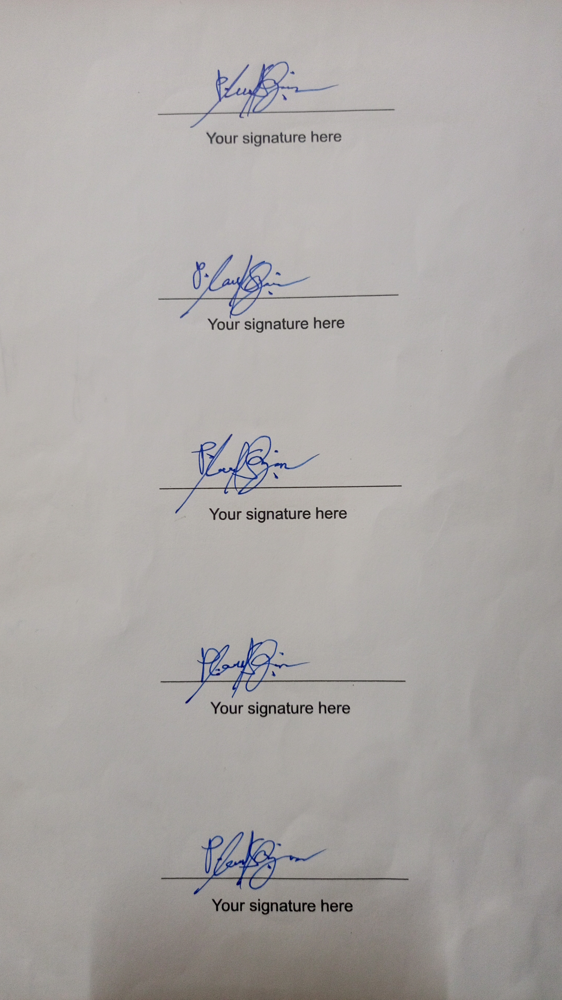

In [138]:
from IPython.display import display

clean_doc = clean_document(img)
display(Image.open("docu5.jpg"))

the_biggest_component: 30967.0
average: 329.49214026602175
a4_small_size_outliar_constant: 1080.6313698393506
a4_big_size_outliar_constant: 19451.364657108308


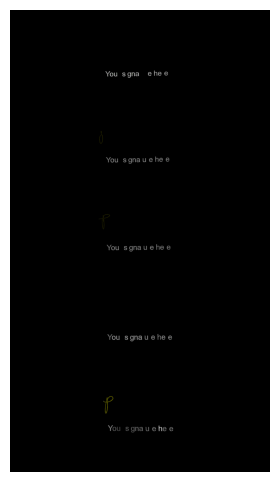

In [124]:
"""Extract signatures from an image."""
# ----------------------------------------------
# --- Author         : Ahmet Ozlu
# --- Mail           : ahmetozlu93@gmail.com
# --- Date           : 17th September 2018
# ----------------------------------------------
# !pip install scikit-image
import cv2
import matplotlib.pyplot as plt
from skimage import measure, morphology
from skimage.color import label2rgb
from skimage.measure import regionprops
import numpy as np

# the parameters are used to remove small size connected pixels outliar 
constant_parameter_1 = 84
constant_parameter_2 = 250
constant_parameter_3 = 100

# the parameter is used to remove big size connected pixels outliar
constant_parameter_4 = 18

# read the input image
# img = cv2.imread('./inputs/in1.jpg', 0)
img = clean_doc
img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]  # ensure binary

# connected component analysis by scikit-learn framework
blobs = img > img.mean()
blobs_labels = measure.label(blobs, background=1)
image_label_overlay = label2rgb(blobs_labels, image=img)

fig, ax = plt.subplots(figsize=(10, 6))

'''
# plot the connected components (for debugging)
ax.imshow(image_label_overlay)
ax.set_axis_off()
plt.tight_layout()
plt.show()
'''

the_biggest_component = 0
total_area = 0
counter = 0
average = 0.0
for region in regionprops(blobs_labels):
    if (region.area > 10):
        total_area = total_area + region.area
        counter = counter + 1
    # print region.area # (for debugging)
    # take regions with large enough areas
    if (region.area >= 250):
        if (region.area > the_biggest_component):
            the_biggest_component = region.area

average = (total_area/counter)
print("the_biggest_component: " + str(the_biggest_component))
print("average: " + str(average))

# experimental-based ratio calculation, modify it for your cases
# a4_small_size_outliar_constant is used as a threshold value to remove connected outliar connected pixels
# are smaller than a4_small_size_outliar_constant for A4 size scanned documents
a4_small_size_outliar_constant = ((average/constant_parameter_1)*constant_parameter_2)+constant_parameter_3
print("a4_small_size_outliar_constant: " + str(a4_small_size_outliar_constant))

# experimental-based ratio calculation, modify it for your cases
# a4_big_size_outliar_constant is used as a threshold value to remove outliar connected pixels
# are bigger than a4_big_size_outliar_constant for A4 size scanned documents
a4_big_size_outliar_constant = a4_small_size_outliar_constant*constant_parameter_4
print("a4_big_size_outliar_constant: " + str(a4_big_size_outliar_constant))

# remove the connected pixels are smaller than a4_small_size_outliar_constant
pre_version = morphology.remove_small_objects(blobs_labels, a4_small_size_outliar_constant)
# remove the connected pixels are bigger than threshold a4_big_size_outliar_constant 
# to get rid of undesired connected pixels such as table headers and etc.
component_sizes = np.bincount(pre_version.ravel())
too_small = component_sizes > (a4_big_size_outliar_constant)
too_small_mask = too_small[pre_version]
pre_version[too_small_mask] = 0
# save the the pre-version which is the image is labelled with colors
# as considering connected components
# plt.imsave('pre_version.png', pre_version)

# read the pre-version
# img = cv2.imread('pre_version.png', 0)
display(pre_version.astype(np.uint8))

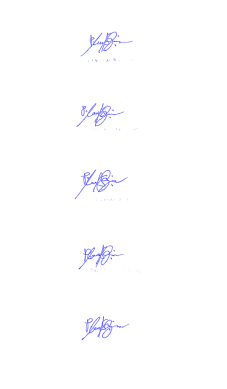

In [118]:
extract_sig = extract_signatures(clean_doc)
display(extract_sig)

In [119]:
signatures = crop_signatures(extract_sig)

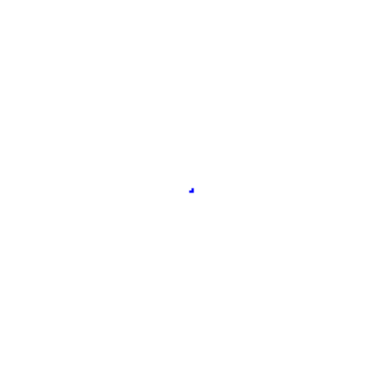

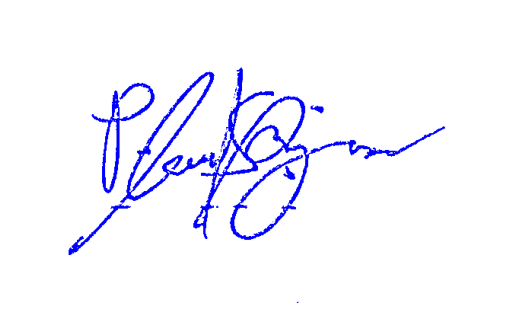

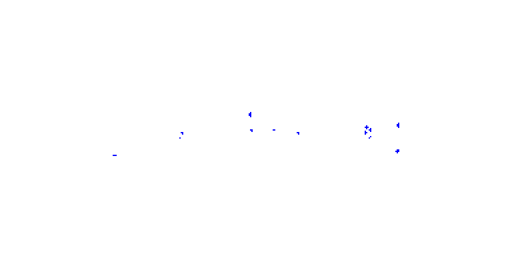

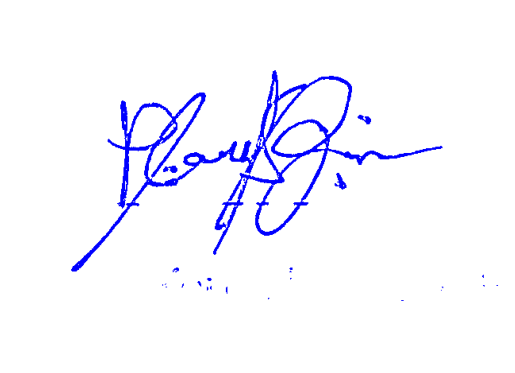

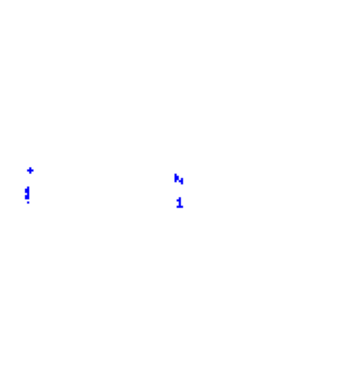

...

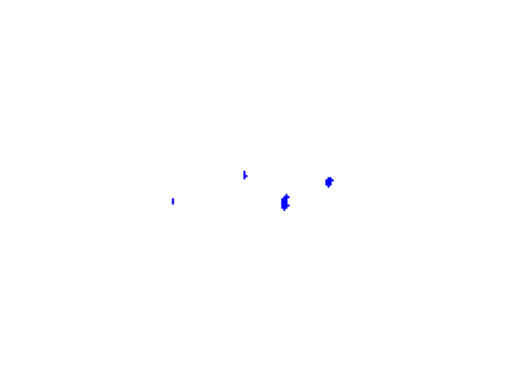

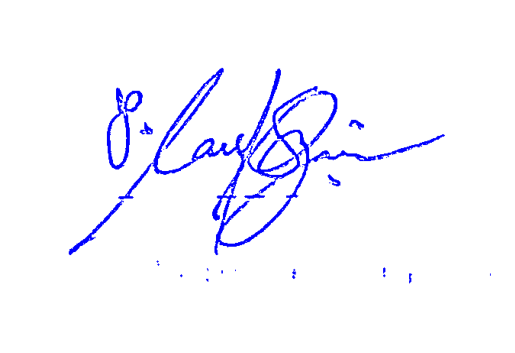

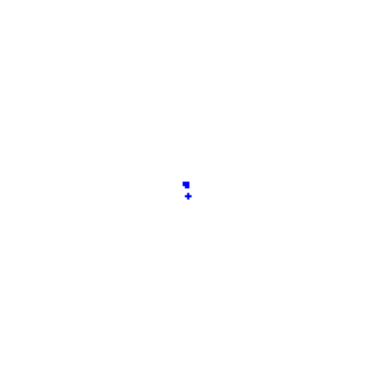

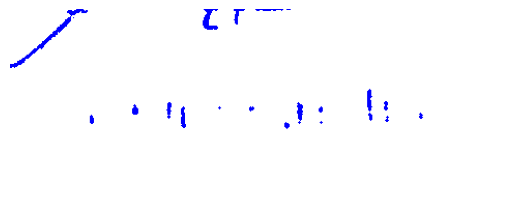

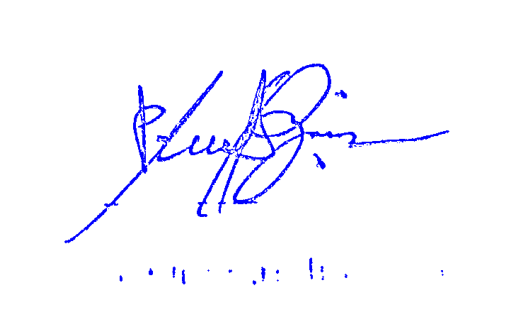

In [120]:
for signature in signatures:
    display(signature)